In [1]:
%cd ../..

/mnt/batch/tasks/shared/LS_root/mounts/clusters/jeffrey-uso9-03-dev-ci01/code/Users/jeffrey.tackes/ModernTS_2E


In [2]:
import os
import shutil
import json

import joblib
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"

from pathlib import Path

from tqdm.autonotebook import tqdm
from IPython.display import display, HTML
# %load_ext autoreload
# %autoreload 2
np.random.seed(42)
tqdm.pandas()

from statsforecast import StatsForecast
from neuralforecast import NeuralForecast
from neuralforecast.models import TimesNet
from neuralforecast.auto import AutoTimesNet
from neuralforecast.losses.pytorch import MQLoss
from utilsforecast.evaluation import evaluate
from utilsforecast.losses import rmse, mae, mse, mase
from neuralforecast.losses.pytorch import MSE, MAE
from functools import partial

from ray import tune
from ray.tune.search.hyperopt import HyperOptSearch


import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")

/tmp/ipykernel_797795/37180740.py:15: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
2024-08-17 16:43:42,577	WARNING __init__.py:21 -- Package pickle5 becomes unnecessary in Python 3.8 and above. Its presence may confuse libraries including Ray. Please uninstall the package.
/anaconda/envs/demand_planning/lib/python3.10/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [3]:
TRAIN_SUBSAMPLE = True  # Trains a subsample of IDs to improve run speed
RETUNE = True  # if false, will use pre-trained hyperparameters when generating the AUTO NeuralForecast

In [4]:
preprocessed = Path("data/london_smart_meters/preprocessed")
output = Path("data/london_smart_meters/output")
try:
    #Reading the missing value imputed and train test split data
    train_df = pd.read_parquet(preprocessed/"selected_blocks_train_missing_imputed_feature_engg.parquet")
    # Read in the Validation dataset as test_df so that we predict on it
    test_df = pd.read_parquet(preprocessed/"selected_blocks_val_missing_imputed_feature_engg.parquet")
    # test_df = pd.read_parquet(preprocessed/"selected_blocks_test_missing_imputed_feature_engg.parquet")
except FileNotFoundError:
    display(HTML("""
    <div class="alert alert-block alert-warning">
    <b>Warning!</b> File not found. Please make sure you have run 01-Feature Engineering.ipynb in Chapter06
    </div>
    """))

In [5]:
train_df.head(2)

,timestamp,LCLid,energy_consumption,frequency,series_length,stdorToU,Acorn,Acorn_grouped,file,holidays,...,timestamp_Minute_sin_1,timestamp_Minute_sin_2,timestamp_Minute_sin_3,timestamp_Minute_sin_4,timestamp_Minute_sin_5,timestamp_Minute_cos_1,timestamp_Minute_cos_2,timestamp_Minute_cos_3,timestamp_Minute_cos_4,timestamp_Minute_cos_5
0,2012-01-01 00:00:00,MAC000061,0.114,30min,37872,Std,ACORN-Q,Adversity,block_96,NO_HOLIDAY,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,1.0,1.0,1.0,1.0
1,2012-01-01 00:30:00,MAC000061,0.113,30min,37872,Std,ACORN-Q,Adversity,block_96,NO_HOLIDAY,...,5.665539e-16,-1.133108e-15,2.143751e-15,-2.266215e-15,6.123234e-16,-1.0,1.0,-1.0,1.0,-1.0


In [6]:
print("Total # of IDs Pre-Sampling: ", len(train_df.LCLid.unique()))

Total # of IDs Pre-Sampling:  150


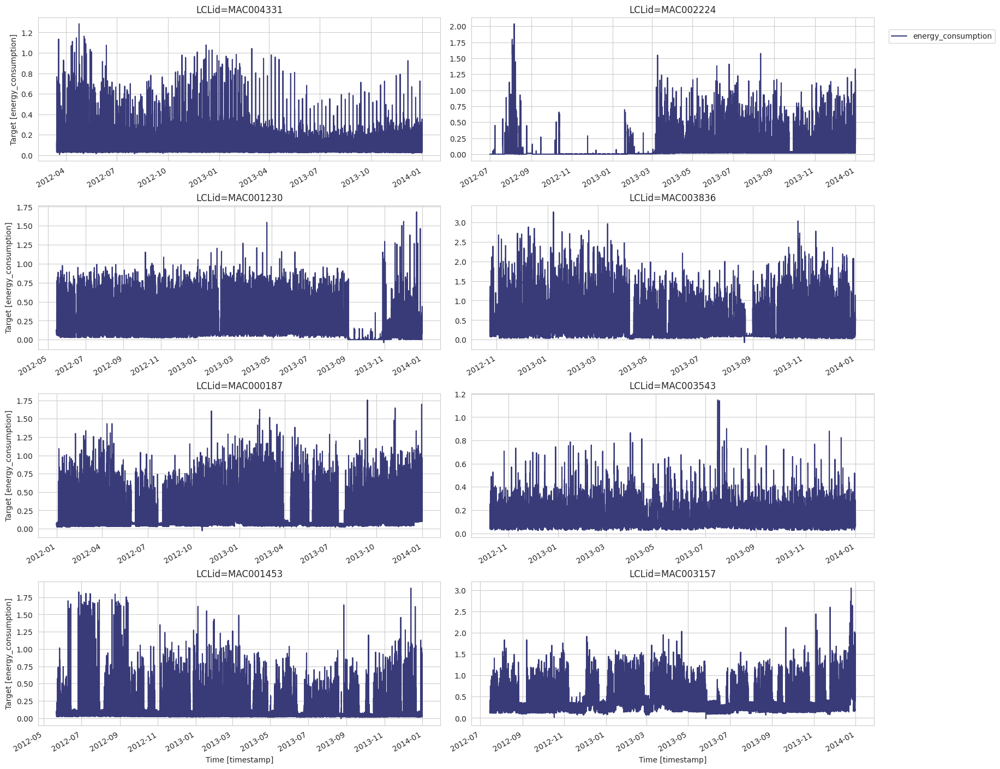

In [7]:
StatsForecast.plot(train_df, engine='matplotlib', id_col='LCLid',time_col= 'timestamp', target_col='energy_consumption')

In [8]:
# To run on smaller set of data for daster iteration.
if TRAIN_SUBSAMPLE:
    print("sub sampling")
    SAMPLE = 10
    sampled_LCLids = pd.Series(train_df.LCLid.unique().remove_unused_categories().categories).sample(SAMPLE, random_state=99).tolist()
    train_df = train_df.loc[train_df.LCLid.isin(sampled_LCLids)]
    test_df = test_df.loc[test_df.LCLid.isin(sampled_LCLids)]

sub sampling


In [9]:
print("Total # of IDs Post Sampling: ", len(train_df.LCLid.unique()))

Total # of IDs Post Sampling:  10


## Train, Validation, Test Set

In [10]:
print("Training Min Date: ", train_df.timestamp.min(), 
      "\nTraining Max Date: ", train_df.timestamp.max(), 
      "\nTesting Min Date: ", test_df.timestamp.min(),
      "\nTesting Max Date: ", test_df.timestamp.max()
)

Training Min Date:  2012-01-01 00:00:00 
Training Max Date:  2013-12-31 23:30:00 
Testing Min Date:  2014-01-01 00:00:00 
Testing Max Date:  2014-01-31 23:30:00


In [11]:
#Keeping 1 days aside as a validation set
cutoff = train_df.timestamp.max() - pd.Timedelta(1, "D")

validation_df = train_df[(train_df.timestamp>cutoff)].reset_index(drop=True) # validation prediction set
training_df = train_df[(train_df.timestamp<=cutoff)].reset_index(drop=True) # training set used for validation set

print(f"Train Max: {training_df.timestamp.max()} \nValidation Min: {validation_df.timestamp.min()} \nValidation Max: {validation_df.timestamp.max()}")
print(f"Validation Horizon: {len(validation_df.timestamp.unique())}")


Train Max: 2013-12-30 23:30:00 
Validation Min: 2013-12-31 00:00:00 
Validation Max: 2013-12-31 23:30:00
Validation Horizon: 48


##### Define Validation model parameters

In [12]:
h = 48
max_steps = 100

## Training TimesNet Model

In [13]:
training_df[['LCLid']].nunique()[0]

10

In [14]:
len(training_df['LCLid'].unique())

10

In [15]:
model_untuned = [TimesNet (h=h, input_size = 48*7, 
                max_steps = max_steps,)]

model_untuned = NeuralForecast(models=model_untuned, freq='30min')
model_untuned.fit(training_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption')

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name           | Type          | Params
-------------------------------------------------
0 | loss           | MAE           | 0     
1 | padder_train   | ConstantPad1d | 0     
2 | scaler         | TemporalNorm  | 0     
3 | model          | ModuleList    | 4.7 M 
4 | enc_embedding  | DataEmbedding | 192   
5 | layer_norm     | LayerNorm     | 128   
6 | predict_linear | Linear        | 129 K 
7 | projection     | Linear        | 65    
-------------------------------------------------
4.8 M     Trainable params
0         Non-trainable params
4.8 M     Total params
19.269    Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


In [16]:
# Get Predictions for validation
pred_df =  model_untuned.predict(futr_df=validation_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df = pred_df.merge(validation_df[['LCLid','timestamp','energy_consumption']], on=['LCLid','timestamp'], how='left')
pred_df.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,TimesNet,energy_consumption
0,MAC000126,2013-12-31 00:00:00,0.077406,0.093
1,MAC000126,2013-12-31 00:30:00,0.070853,0.109
2,MAC000126,2013-12-31 01:00:00,0.056795,0.082
3,MAC000126,2013-12-31 01:30:00,0.061872,0.067
4,MAC000126,2013-12-31 02:00:00,0.050296,0.043


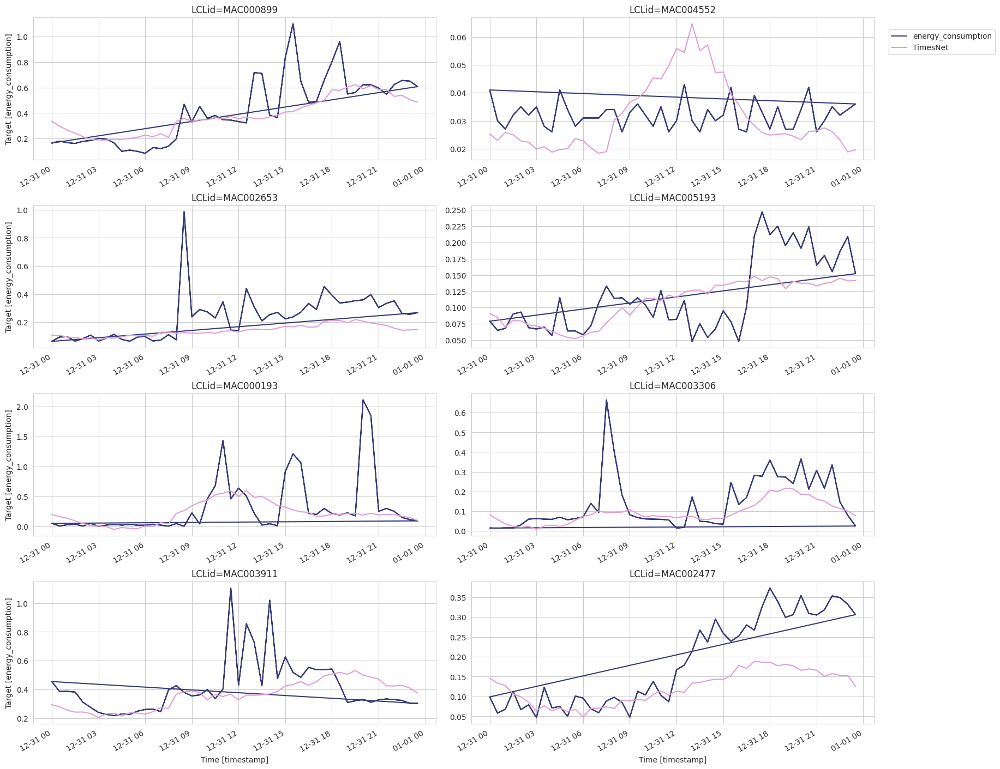

In [17]:
#visualize results
StatsForecast.plot(validation_df[['LCLid','timestamp','energy_consumption']], 
                   pred_df, engine='matplotlib', 
                   id_col='LCLid',
                   time_col= 'timestamp', 
                   target_col='energy_consumption',
                   models=['TimesNet'])

#### Evaluate TimesNet forecast

In [18]:
fcst_mase = partial(mase, seasonality=48)

# Get metrics for individual LCLid's
TimesNet_metrics = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

# Get aggregated metrics for across all LCLid's by model
TimesNet_metrics_agg = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [19]:
TimesNet_metrics_agg

,metric,TimesNet
0,rmse,0.137788
1,mae,0.083945
2,mse,0.033702
3,mase,0.770216


## TimesNet Tuned
Since hyperparameters are key to performance in Neural Networks, NIXTLA has made this search each through the incorporation of Auto forecast.
Each NeuralForecast model has an AUTO class which allow you to easily tune your hyperparameters.

Auto Forecast can time, you can load the pre-trained hyperparameters or choose to retune on your own.
Set ```RETUNE = True``` if you wish to retune.


In [20]:
# Define the file path
config_file_path = 'notebooks/Chapter16/saved_params_config/TimesNet_best_config.json'
try:
    with open(config_file_path, 'r') as config_file:
        loaded_config = json.load(config_file)
        print(loaded_config)
except FileNotFoundError:
    display(HTML("""
    <div class="alert alert-block alert-warning">
    <b>Warning!</b> File not found. 
    </div>
    """))
    

In [22]:
TimesNet_config = {
    "max_steps": max_steps,  # This parameter can be adjusted if needed
    "input_size": tune.choice([h,h*7,h*7*2,h*7*3]), # Size of input window
    "learning_rate": tune.loguniform(1e-4, 1e-1),  # Initial learning rate
    "scaler_type": tune.choice(["minmax", "standard"]),
    "batch_size": tune.choice([32, 64,128, 256]),
    "hidden_size": tune.choice([32, 64,128, 256]),
    "random_seed": tune.choice([10, 20,30]),


}

if RETUNE == True:
    models = [AutoTimesNet(h=h, 
                     config = TimesNet_config,
                     search_alg = HyperOptSearch(),
                     backend = 'ray',
                     num_samples = 100,
                     #cpus=10,
                     loss=MSE(),
                     valid_loss=MAE(),  
                     )]

else:
    models = [AutoTimesNet(h=h, 
                    config = loaded_config,
                    search_alg = None,
                    backend = 'ray',
                    #cpus=1
                    )]


model_tuned = NeuralForecast(models=models, freq='30min')
model_tuned.fit(training_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption',  val_size = 48)

(_train_tune pid=891776) /anaconda/envs/demand_planning/lib/python3.10/site-packages/ray/tune/integration/pytorch_lightning.py:194: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=891776) Seed set to 20
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_5d632ce4_1_batch_size=256,h=48,hidden_size=256,input_size=336,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-55-03/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -----------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [03:08<00:00,  0.01it/s, v_num=0, train_loss_step=1.260, train_loss_epoch=0.823]


2024-08-17 21:01:52,126	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [03:24<00:00,  0.00it/s, v_num=0, train_loss_step=1.260, train_loss_epoch

(_train_tune pid=891776) Seed set to 20
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_8208721b_2_batch_size=64,h=48,hidden_size=128,input_size=48,learning_rate=0.0026,loss=ref_ph_de895953,max_steps=100,ra_2024-08-17_16-55-07/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:38:30,443	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [01:15<00:00,  0.01it/s, v_num=0, train_loss_step=1.910, train_loss_epoch

(_train_tune pid=891776) Seed set to 30
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_fd4db8af_3_batch_size=32,h=48,hidden_size=256,input_size=1008,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,_2024-08-17_21-01-52/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-18 00:37:50,684	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:27<00:00,  0.04it/s, v_num=0, train_loss_step=0.0204, train_loss_epoch=

(_train_tune pid=891776) Seed set to 30
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_02a4dceb_4_batch_size=32,h=48,hidden_size=256,input_size=1008,learning_rate=0.0096,loss=ref_ph_de895953,max_steps=100,_2024-08-17_22-38-30/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:21<00:00,  0.05it/s, v_num=0, train_loss_step=0.954, train_loss_epoch=1.150]


2024-08-18 01:16:46,512	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:23<00:00,  0.04it/s, v_num=0, train_loss_step=0.954, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_b6ff427b_5_batch_size=256,h=48,hidden_size=64,input_size=672,learning_rate=0.0028,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_00-37-50/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.20it/s, v_num=0, train_loss_step=1.420, train_loss_epoch=1.210]


2024-08-18 01:24:31,604	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.18it/s, v_num=0, train_loss_step=1.420, train_loss_epoch

(_train_tune pid=891776) Seed set to 20
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_abf74b86_6_batch_size=64,h=48,hidden_size=256,input_size=672,learning_rate=0.0187,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_01-16-46/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:17<00:00,  0.06it/s, v_num=0, train_loss_step=0.0188, train_loss_epoch=1.510]


2024-08-18 01:50:42,908	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:17<00:00,  0.06it/s, v_num=0, train_loss_step=0.0188, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_92e381b7_7_batch_size=32,h=48,hidden_size=128,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_01-24-31/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:09<00:00,  0.11it/s, v_num=0, train_loss_step=1.360, train_loss_epoch=1.150]


2024-08-18 02:03:55,672	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:10<00:00,  0.10it/s, v_num=0, train_loss_step=1.360, train_loss_epoch

(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_591443ce_8_batch_size=256,h=48,hidden_size=64,input_size=1008,learning_rate=0.0689,loss=ref_ph_de895953,max_steps=100,_2024-08-18_01-50-42/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.14it/s, v_num=0, train_loss_step=0.0202, train_loss_epoch=0.0182]


2024-08-18 02:15:17,387	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=0.0202, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_5f97dc8c_9_batch_size=64,h=48,hidden_size=64,input_size=336,learning_rate=0.0134,loss=ref_ph_de895953,max_steps=100,ra_2024-08-18_02-03-55/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.0607, train_loss_epoch=0.0235]


2024-08-18 02:20:24,691	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.0607, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_09b9c230_10_batch_size=128,h=48,hidden_size=64,input_size=336,learning_rate=0.0046,loss=ref_ph_de895953,max_steps=100,_2024-08-18_02-15-17/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.36it/s, v_num=0, train_loss_step=1.340, train_loss_epoch=0.904]


2024-08-18 02:24:54,868	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=1.340, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_e6f81aef_11_batch_size=32,h=48,hidden_size=256,input_size=48,learning_rate=0.0036,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_02-20-24/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-18 02:29:52,968	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_6a615248_12_batch_size=128,h=48,hidden_size=32,input_size=48,learning_rate=0.0025,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_02-24-54/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.0989, train_loss_epoch=

2024-08-18 02:30:47,958	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.81it/s, v_num=0, train_loss_step=0.108, train_loss_epoch=0.112]


(_train_tune pid=891776) Seed set to 20
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_b9bfcccc_13_batch_size=256,h=48,hidden_size=256,input_size=48,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,_2024-08-18_02-29-52/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.152, train_loss_epoch=0.153]


2024-08-18 02:35:18,268	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=0.152, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_84b7086c_14_batch_size=32,h=48,hidden_size=64,input_size=1008,learning_rate=0.0157,loss=ref_ph_de895953,max_steps=100,_2024-08-18_02-30-47/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=0.865, train_loss_epoch=1.050]


2024-08-18 02:46:46,453	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.14it/s, v_num=0, train_loss_step=0.865, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_2c1e96bf_15_batch_size=32,h=48,hidden_size=32,input_size=336,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_02-35-18/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.54it/s, v_num=0, train_loss_step=0.0537, train_loss_epoch=0.0198]


2024-08-18 02:50:11,040	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.49it/s, v_num=0, train_loss_step=0.0537, train_loss_epoch=

(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_06e3ca45_16_batch_size=256,h=48,hidden_size=64,input_size=48,learning_rate=0.0020,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_02-46-46/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.31it/s, v_num=0, train_loss_step=0.184, train_loss_epoch=11.30]


2024-08-18 02:51:45,084	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.15it/s, v_num=0, train_loss_step=0.184, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_c8afbe9d_17_batch_size=256,h=48,hidden_size=64,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,_2024-08-18_02-50-11/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.20it/s, v_num=0, train_loss_step=0.0234, train_loss_epoch=0.0232]


2024-08-18 03:00:05,857	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.19it/s, v_num=0, train_loss_step=0.0234, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_287c05b5_18_batch_size=128,h=48,hidden_size=64,input_size=48,learning_rate=0.0018,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_02-51-45/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.90it/s, v_num=0, train_loss_step=0.125, train_loss_epoch=0.135]


2024-08-18 03:01:39,384	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.81it/s, v_num=0, train_loss_step=0.125, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_04ed0f1e_19_batch_size=128,h=48,hidden_size=64,input_size=48,learning_rate=0.0224,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_03-00-05/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.33it/s, v_num=0, train_loss_step=0.141, train_loss_epoch=0.139]


2024-08-18 03:03:06,596	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.18it/s, v_num=0, train_loss_step=0.141, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_eee59b7a_20_batch_size=32,h=48,hidden_size=256,input_size=48,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_03-01-39/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.505, train_loss_epoch=102.0]


2024-08-18 03:08:08,900	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.505, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_fee92dec_21_batch_size=32,h=48,hidden_size=128,input_size=672,learning_rate=0.0455,loss=ref_ph_de895953,max_steps=100,_2024-08-18_03-03-06/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 8:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=1.070, train_loss_epoch=1.070]


Bad pipe message: %s [b'\xe2~n\xc1\xa0\x89\x941\xdb\x17\x06\x89\x81\x82\xb8\x05\x97\xab \x02;\x904\xfb\x0c\xa6\xf8\x1d`\x86\xf1G\x0b+\xe9q\xe05\xb6\xca\xff\xe0S\xd2#\x88\x84\x83\xb5@\x86\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00']
Bad pipe message: %s [b"z\xc3\xb5w\x15\xe8\xdf\x0cX;\xf7n\xbdp\xee\xd9\xfb\x82\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#\xc0'\x00g\x00@\xc0\n\xc0\x14\x009\x008\xc0\t\xc0\x13\x003\x002\x00\x9d\xc0\xa1\xc0\x9d\xc0Q\x00\x9c\xc0\xa0\xc0\x9c\xc0P\x00=\x00<\x005\x00/\x00\x9a\x00\x99\xc0\x07\xc0\x11\x00\x96\x00\x05\x00\xff\x01\x00\x00j\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=1.490, train_loss_epoch=1.290]


2024-08-18 03:22:22,396	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.11it/s, v_num=0, train_loss_step=1.490, train_loss_epoch

(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_2b3c9825_22_batch_size=32,h=48,hidden_size=128,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100_2024-08-18_03-08-08/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:12<00:00,  0.08it/s, v_num=0, train_loss_step=0.919, train_loss_epoch=0.961]


2024-08-18 03:43:24,739	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:12<00:00,  0.08it/s, v_num=0, train_loss_step=0.919, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_e4b59f23_23_batch_size=32,h=48,hidden_size=128,input_size=672,learning_rate=0.0078,loss=ref_ph_de895953,max_steps=100,_2024-08-18_03-22-22/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:09<00:00,  0.10it/s, v_num=0, train_loss_step=1.540, train_loss_epoch=1.320]


2024-08-18 03:59:56,705	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:10<00:00,  0.10it/s, v_num=0, train_loss_step=1.540, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_2472a0fc_24_batch_size=32,h=48,hidden_size=128,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100_2024-08-18_03-43-24/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:11<00:00,  0.08it/s, v_num=0, train_loss_step=0.920, train_loss_epoch=0.962]


2024-08-18 04:20:40,839	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:12<00:00,  0.08it/s, v_num=0, train_loss_step=0.920, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_77679fe6_25_batch_size=32,h=48,hidden_size=128,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100_2024-08-18_03-59-56/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:13<00:00,  0.07it/s, v_num=0, train_loss_step=0.924, train_loss_epoch=0.967]


2024-08-18 04:42:54,237	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:14<00:00,  0.07it/s, v_num=0, train_loss_step=0.924, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_878cefd8_26_batch_size=32,h=48,hidden_size=128,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,_2024-08-18_04-20-40/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.11it/s, v_num=0, train_loss_step=1.330, train_loss_epoch=1.080]


2024-08-18 04:56:00,714	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:09<00:00,  0.10it/s, v_num=0, train_loss_step=1.330, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_7012a71e_27_batch_size=32,h=48,hidden_size=128,input_size=672,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100,_2024-08-18_04-42-54/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=1.360, train_loss_epoch=1.140]


2024-08-18 05:09:27,609	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.11it/s, v_num=0, train_loss_step=1.360, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_f948eaca_28_batch_size=64,h=48,hidden_size=128,input_size=1008,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100_2024-08-18_04-56-00/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:13<00:00,  0.07it/s, v_num=0, train_loss_step=0.948, train_loss_epoch=0.986]


2024-08-18 05:31:16,707	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:14<00:00,  0.07it/s, v_num=0, train_loss_step=0.948, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_a1103732_29_batch_size=32,h=48,hidden_size=32,input_size=672,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_05-09-27/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=1.070]


2024-08-18 05:36:00,903	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_0011580d_30_batch_size=32,h=48,hidden_size=128,input_size=672,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100,_2024-08-18_05-31-16/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=1.380, train_loss_epoch=1.140]


2024-08-18 05:49:01,106	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.11it/s, v_num=0, train_loss_step=1.380, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_53b4e559_31_batch_size=64,h=48,hidden_size=32,input_size=672,learning_rate=0.0012,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_05-36-00/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=1.050]


2024-08-18 05:53:47,670	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_d06e09ee_32_batch_size=32,h=48,hidden_size=32,input_size=672,learning_rate=0.0059,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_05-49-01/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=1.340, train_loss_epoch=1.120]


(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=1.340, train_loss_epoch

2024-08-18 05:58:31,083	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=891776) 


(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_97cc4008_33_batch_size=64,h=48,hidden_size=32,input_size=672,learning_rate=0.0016,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_05-53-47/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.28it/s, v_num=0, train_loss_step=1.280, train_loss_epoch=1.110]


2024-08-18 06:03:50,819	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.26it/s, v_num=0, train_loss_step=1.280, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_65c0bd3c_34_batch_size=64,h=48,hidden_size=32,input_size=672,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_05-58-31/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=1.290, train_loss_epoch=1.050]


2024-08-18 06:08:42,965	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_4dce59c1_35_batch_size=64,h=48,hidden_size=32,input_size=336,learning_rate=0.0012,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_06-03-50/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.54it/s, v_num=0, train_loss_step=1.100

2024-08-18 06:11:34,255	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.50it/s, v_num=0, train_loss_step=1.100, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_c2b30aa4_36_batch_size=64,h=48,hidden_size=32,input_size=672,learning_rate=0.0044,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_06-08-42/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=1.310, train_loss_epoch=1.090]


2024-08-18 06:16:57,680	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=1.310, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_c21f3886_37_batch_size=64,h=48,hidden_size=32,input_size=672,learning_rate=0.0285,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_06-11-34/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=1.540, train_loss_epoch=1.320]


2024-08-18 06:22:09,595	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.28it/s, v_num=0, train_loss_step=1.540, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_13ea63d9_38_batch_size=64,h=48,hidden_size=32,input_size=672,learning_rate=0.0100,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_06-16-57/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=1.670, train_loss_epoch=1.460]


2024-08-18 06:27:39,375	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_b29fb4b5_39_batch_size=64,h=48,hidden_size=32,input_size=336,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_06-22-09/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.58it/s, v_num=0, train_loss_step=0.824

2024-08-18 06:30:22,139	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.53it/s, v_num=0, train_loss_step=0.824, train_loss_epoch

(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_a4275b37_40_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,_2024-08-18_06-27-39/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=1.080]


2024-08-18 06:35:10,304	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=

(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_aa9f1f46_41_batch_size=256,h=48,hidden_size=32,input_size=672,learning_rate=0.0029,loss=ref_ph_de895953,max_steps=100,_2024-08-18_06-30-22/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.29it/s, v_num=0, train_loss_step=1.270, train_loss_epoch=1.070]


2024-08-18 06:40:31,065	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.27it/s, v_num=0, train_loss_step=1.270, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_31b2b7ad_42_batch_size=64,h=48,hidden_size=32,input_size=336,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_06-35-10/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.71it/s, v_num=0, train_loss_step=1.080, train_loss_epoch=1.180]


2024-08-18 06:43:11,602	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.63it/s, v_num=0, train_loss_step=1.080, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_3fcd9989_43_batch_size=128,h=48,hidden_size=256,input_size=672,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=100_2024-08-18_06-40-31/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:19<00:00,  0.05it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=1.120]


2024-08-18 07:13:18,283	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:20<00:00,  0.05it/s, v_num=0, train_loss_step=1.300, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_800cb427_44_batch_size=64,h=48,hidden_size=32,input_size=672,learning_rate=0.0043,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_06-43-11/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.762, train_loss_epoch=100.0]


2024-08-18 07:18:23,010	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.762, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_3235c827_45_batch_size=256,h=48,hidden_size=32,input_size=336,learning_rate=0.0022,loss=ref_ph_de895953,max_steps=100,_2024-08-18_07-13-18/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.51it/s, v_num=0, train_loss_step=0.840, train_loss_epoch=180.0]


2024-08-18 07:21:31,266	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.840, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_4f72ff29_46_batch_size=64,h=48,hidden_size=256,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,_2024-08-18_07-18-23/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:17<00:00,  0.06it/s, v_num=0, train_loss_step=1.420, train_loss_epoch=1.250]


2024-08-18 07:50:14,326	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:18<00:00,  0.05it/s, v_num=0, train_loss_step=1.420, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_f071abee_47_batch_size=256,h=48,hidden_size=32,input_size=672,learning_rate=0.0778,loss=ref_ph_de895953,max_steps=100,_2024-08-18_07-21-31/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=1.530, train_loss_epoch=1.290]


2024-08-18 07:55:23,206	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=1.530, train_loss_epoch

(_train_tune pid=891776) Seed set to 20
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_08790cd1_48_batch_size=128,h=48,hidden_size=32,input_size=1008,learning_rate=0.0066,loss=ref_ph_de895953,max_steps=100_2024-08-18_07-50-14/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.22it/s, v_num=0, train_loss_step=0.0213, train_loss_epoch=0.0179]


2024-08-18 08:02:43,663	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.20it/s, v_num=0, train_loss_step=0.0213, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_f5b52a4e_49_batch_size=64,h=48,hidden_size=256,input_size=48,learning_rate=0.0034,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_07-55-23/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=1.820, train_loss_epoch=135.0]


2024-08-18 08:07:56,800	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_b8659573_50_batch_size=32,h=48,hidden_size=32,input_size=672,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_08-02-43/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.27it/s, v_num=0, train_loss_step=0.0164

2024-08-18 08:13:52,671	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.25it/s, v_num=0, train_loss_step=0.0164, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_27dda284_51_batch_size=256,h=48,hidden_size=64,input_size=48,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_08-07-56/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.04it/s, v_num=0, train_loss_step=2.340, train_loss_epoch=2.01e+3]


2024-08-18 08:15:20,374	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.94it/s, v_num=0, train_loss_step=2.340, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_52a50360_52_batch_size=128,h=48,hidden_size=32,input_size=336,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,_2024-08-18_08-13-52/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.54it/s, v_num=0, train_loss_step=0.891, train_loss_epoch=180.0]


2024-08-18 08:18:07,811	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.49it/s, v_num=0, train_loss_step=0.891, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_f35cd883_53_batch_size=32,h=48,hidden_size=256,input_size=672,learning_rate=0.0099,loss=ref_ph_de895953,max_steps=100,_2024-08-18_08-15-20/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:16<00:00,  0.06it/s, v_num=0, train_loss_step=0.0658, train_loss_epoch=0.0263]


2024-08-18 08:47:26,157	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:17<00:00,  0.06it/s, v_num=0, train_loss_step=0.0658, train_loss_epoch=

(_train_tune pid=891776) Seed set to 20
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_f81a109f_54_batch_size=64,h=48,hidden_size=32,input_size=1008,learning_rate=0.0017,loss=ref_ph_de895953,max_steps=100,_2024-08-18_08-18-07/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.819, train_loss_epoch=0.759]


2024-08-18 08:54:14,523	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.29it/s, v_num=0, train_loss_step=0.819, train_loss_epoch

(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_968736d4_55_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0154,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_08-47-26/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | model          | ModuleList    | 4.7 M 
(_train_tune pid=891776) 5 | enc_embedding  | DataEmbedding | 192   
(_train_tune pid=891776) 6 | layer_norm     | LayerNorm     | 128   
(_train_tune pid=891776) 7 | predict_linear | Linear        | 484 K 
(_tr

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.20it/s, v_num=0, train_loss_step=0.0795, train_loss_epoch=0.0347]


2024-08-18 09:02:38,287	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.19it/s, v_num=0, train_loss_step=0.0795, train_loss_epoch=

(_train_tune pid=891776) Seed set to 30
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_1b96b45d_56_batch_size=128,h=48,hidden_size=32,input_size=48,learning_rate=0.0022,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_08-54-14/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.85it/s, v_num=0, train_loss_step=2.420, train_loss_epoch=2.01e+3]


2024-08-18 09:03:39,372	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.58it/s, v_num=0, train_loss_step=2.420, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_55b7f2dd_57_batch_size=256,h=48,hidden_size=64,input_size=336,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,_2024-08-18_09-02-38/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.869, train_loss_epoch=180.0]


2024-08-18 09:08:38,294	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.869, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_0dad60ba_58_batch_size=32,h=48,hidden_size=256,input_size=672,learning_rate=0.0534,loss=ref_ph_de895953,max_steps=100,_2024-08-18_09-03-39/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:14<00:00,  0.07it/s, v_num=0, train_loss_step=0.0219, train_loss_epoch=1.510]


2024-08-18 09:36:36,324	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:15<00:00,  0.07it/s, v_num=0, train_loss_step=0.0219, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_0da57aae_59_batch_size=64,h=48,hidden_size=32,input_size=1008,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=100,_2024-08-18_09-08-38/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.27it/s, v_num=0, train_loss_step=0.908, train_loss_epoch=0.949]


2024-08-18 09:43:21,978	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_fa7aba4b_60_batch_size=32,h=48,hidden_size=32,input_size=672,learning_rate=0.0057,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_09-36-36/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.36it/s, v_num=0, train_loss_step=1.380

2024-08-18 09:48:16,093	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.33it/s, v_num=0, train_loss_step=1.380, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_8c6e0bb4_61_batch_size=32,h=48,hidden_size=64,input_size=48,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,ra_2024-08-18_09-43-21/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.46it/s, v_num=0, train_loss_step=2.370, train_loss_epoch=2.01e+3]


2024-08-18 09:49:40,729	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}



Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.28it/s, v_num=0, train_loss_step=2.370, train_loss_epoch=2.01e+3, valid_loss=0.117]

(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.28it/s, v_num=0, train_loss_step=2.370, train_loss_epoch=2.370, valid_loss=0.117]


(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_dc3fba76_62_batch_size=64,h=48,hidden_size=32,input_size=672,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_09-48-16/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.36it/s, v_num=0, train_loss_step=0.0624, train_loss_epoch=0.022]


2024-08-18 09:54:13,133	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.0624, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_68fb6143_63_batch_size=128,h=48,hidden_size=256,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=10_2024-08-18_09-49-40/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:22<00:00,  0.05it/s, v_num=0, train_loss_step=0.869, train_loss_epoch=0.805]


2024-08-18 10:32:36,245	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:23<00:00,  0.04it/s, v_num=0, train_loss_step=0.869, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_b8ebf8a4_64_batch_size=256,h=48,hidden_size=128,input_size=672,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100_2024-08-18_09-54-13/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=1.340, train_loss_epoch=1.080]


2024-08-18 10:45:59,405	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.11it/s, v_num=0, train_loss_step=1.340, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_3cc9ec0d_65_batch_size=32,h=48,hidden_size=32,input_size=336,learning_rate=0.0281,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_10-32-36/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.61it/s, v_num=0, train_loss_step=0.0259, train_loss_epoch=1.800]


2024-08-18 10:48:37,915	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_b255c3f0_66_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,_2024-08-18_10-45-59/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.55it/s, v_num=0, train_loss_step=0.0259, train_loss_epoch=

2024-08-18 10:53:13,762	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=1.290, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_fe9ee8e0_67_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0014,loss=ref_ph_de895953,max_steps=100,_2024-08-18_10-48-37/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.28it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=1.110]


2024-08-18 10:58:49,907	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.26it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_50e0319b_68_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,_2024-08-18_10-53-13/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.36it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=1.070]


(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 


2024-08-18 11:03:32,057	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.33it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=1.300, valid_loss=0.0974]


(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_7e0cf0d6_69_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,_2024-08-18_10-58-49/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=1.290, train_loss_epoch=1.080]


2024-08-18 11:08:26,069	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=1.290, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_3a4ae6f3_70_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100,_2024-08-18_11-03-32/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=1.290, train_loss_epoch=1.080]


2024-08-18 11:13:06,217	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_b1d8c0e6_71_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,_2024-08-18_11-08-26/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=1.310

2024-08-18 11:17:42,901	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=1.310, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_47323c55_72_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,_2024-08-18_11-13-06/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.36it/s, v_num=0, train_loss_step=1.290, train_loss_epoch=1.080]


2024-08-18 11:22:45,909	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_ae3d5b08_73_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,_2024-08-18_11-17-42/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=1.290, train_loss_epoch=

2024-08-18 11:27:43,193	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=1.300, train_loss_epoch

(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_d2ce8725_74_batch_size=128,h=48,hidden_size=128,input_size=672,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=100_2024-08-18_11-22-45/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:09<00:00,  0.11it/s, v_num=0, train_loss_step=1.310, train_loss_epoch=1.080]


2024-08-18 11:41:22,673	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_a8caf21c_75_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,_2024-08-18_11-27-43/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=1.290

2024-08-18 11:46:14,371	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_cc963da3_76_batch_size=128,h=48,hidden_size=32,input_size=48,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_11-41-22/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.70it/s, v_num=0, train_loss_step=1.800

2024-08-18 11:47:12,652	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.48it/s, v_num=0, train_loss_step=1.800, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_9f5f2a24_77_batch_size=128,h=48,hidden_size=64,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,_2024-08-18_11-46-14/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.19it/s, v_num=0, train_loss_step=1.450, train_loss_epoch=1.250]


2024-08-18 11:56:13,279	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_e8b323ee_78_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,_2024-08-18_11-47-12/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=1.290

2024-08-18 12:00:58,356	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_c38864c9_79_batch_size=128,h=48,hidden_size=32,input_size=1008,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100_2024-08-18_11-56-13/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.22it/s, v_num=0, train_loss_step=0.959

2024-08-18 12:08:20,501	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.21it/s, v_num=0, train_loss_step=0.959, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_c5e097b4_80_batch_size=128,h=48,hidden_size=128,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100_2024-08-18_12-00-58/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:10<00:00,  0.10it/s, v_num=0, train_loss_step=0.849, train_loss_epoch=101.0]


2024-08-18 12:23:57,239	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:10<00:00,  0.09it/s, v_num=0, train_loss_step=0.849, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_0b5f8255_81_batch_size=128,h=48,hidden_size=256,input_size=336,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100_2024-08-18_12-08-20/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:11<00:00,  0.09it/s, v_num=0, train_loss_step=0.929, train_loss_epoch=180.0]


2024-08-18 12:42:31,753	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:11<00:00,  0.09it/s, v_num=0, train_loss_step=0.929, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_e3048d39_82_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0025,loss=ref_ph_de895953,max_steps=100,_2024-08-18_12-23-57/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=1.070]


2024-08-18 12:47:54,409	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.27it/s, v_num=0, train_loss_step=1.300, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_205e0f36_83_batch_size=128,h=48,hidden_size=32,input_size=48,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_12-42-31/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=102.0, train_loss_epoch=102.0]


(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
2024-08-18 12:48:49,486	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.71it/s, v_num=0, train_loss_step=0.195, train_loss_epoch=102.0]


(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_1a51dd24_84_batch_size=128,h=48,hidden_size=64,input_size=672,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,_2024-08-18_12-47-54/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.19it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=1.100]


2024-08-18 12:57:13,009	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.18it/s, v_num=0, train_loss_step=1.300, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_ea43b936_85_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,_2024-08-18_12-48-49/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=1.310, train_loss_epoch=1.080]


2024-08-18 13:02:00,459	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=1.310, train_loss_epoch

(_train_tune pid=891776) Seed set to 20
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_b55bce61_86_batch_size=128,h=48,hidden_size=128,input_size=1008,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=10_2024-08-18_12-57-13/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:14<00:00,  0.07it/s, v_num=0, train_loss_step=0.858, train_loss_epoch=0.784]


2024-08-18 13:24:46,643	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_d9605d02_87_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0039,loss=ref_ph_de895953,max_steps=100,_2024-08-18_13-02-00/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:15<00:00,  0.07it/s, v_num=0, train_loss_step=0.858, train_loss_epoch=

2024-08-18 13:29:43,389	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=1.330, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_0f449c8d_88_batch_size=128,h=48,hidden_size=256,input_size=336,learning_rate=0.0018,loss=ref_ph_de895953,max_steps=100_2024-08-18_13-24-46/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Sanity Checking DataLoader 0:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              | 0/1 [00:00<?, ?it/s]


2024-08-18 13:46:44,262	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:12<00:00,  0.08it/s, v_num=0, train_loss_step=0.0315, train_loss_epoch=

(_train_tune pid=891776) Seed set to 30
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_3921cdb3_89_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,_2024-08-18_13-29-43/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=1.380, train_loss_epoch=1.190]


2024-08-18 13:51:16,907	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_bce5077d_90_batch_size=256,h=48,hidden_size=32,input_size=48,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_13-46-44/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.74it/s, v_num=0, train_loss_step=1.780

2024-08-18 13:52:16,028	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.53it/s, v_num=0, train_loss_step=1.780, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_03831250_91_batch_size=128,h=48,hidden_size=64,input_size=672,learning_rate=0.0029,loss=ref_ph_de895953,max_steps=100,_2024-08-18_13-51-16/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.23it/s, v_num=0, train_loss_step=0.939, train_loss_epoch=101.0]


2024-08-18 14:00:19,498	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_6c47d075_92_batch_size=128,h=48,hidden_size=32,input_size=1008,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100_2024-08-18_13-52-16/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) ----------------------------------------------

(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.25it/s, v_num=0, train_loss_step=0.930

2024-08-18 14:07:36,116	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.23it/s, v_num=0, train_loss_step=0.930, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_0f441c17_93_batch_size=128,h=48,hidden_size=128,input_size=672,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100_2024-08-18_14-00-19/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=0.0928, train_loss_epoch=0.0322]


2024-08-18 14:20:45,356	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.11it/s, v_num=0, train_loss_step=0.0928, train_loss_epoch=

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_2092dcb2_94_batch_size=256,h=48,hidden_size=32,input_size=336,learning_rate=0.0021,loss=ref_ph_de895953,max_steps=100,_2024-08-18_14-07-36/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.50it/s, v_num=0, train_loss_step=1.100, train_loss_epoch=1.240]


2024-08-18 14:24:03,634	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=1.100, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_a0081234_95_batch_size=128,h=48,hidden_size=256,input_size=672,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=100_2024-08-18_14-20-45/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:18<00:00,  0.05it/s, v_num=0, train_loss_step=1.280, train_loss_epoch=1.050]


2024-08-18 14:53:51,755	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:19<00:00,  0.05it/s, v_num=0, train_loss_step=1.280, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_4c080ad7_96_batch_size=128,h=48,hidden_size=32,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,_2024-08-18_14-24-03/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 83:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=9.560, train_loss_epoch=9.560]


Bad pipe message: %s [b'\x95\x1b\xfa\xcch\xba\xaf\xfb\xcaj\xd3\xb2\xc8\xab\xc4\xe0\x9a\xae \x9a\x0c\x92\x1b\xc84\xb5\xaeX\x87\xc5\xea\xb9\xf3\xcfj\xb3\x8f\xbfC\xb0\xea\xa1\x94[\x1b\xeb\\{\xb2\xfeL\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06', b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 \xc9f\xd5\xe3\xd0z0\xa9\x82\xcaJ\xd0\x86\t[\xaa\xe8\x01\x0b\x7fE\x00']
Bad pipe message: %s [b"<\xb3\x1fWy\x88\xfb\x1d\x08\xa4\x83)m\xac>6YW\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:41<00:00,  0.02it/s, v_num=0, train_loss_step=1.310, train_loss_epoch=1.090]


2024-08-18 15:20:54,034	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 20


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:52<00:00,  0.02it/s, v_num=0, train_loss_step=1.310, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_21baf673_97_batch_size=128,h=48,hidden_size=32,input_size=48,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,r_2024-08-18_14-53-51/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-18 15:32:04,728	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.64it/s, v_num=0, train_loss_step=0.123, train_loss_epoch

(_train_tune pid=891776) Seed set to 10
(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_ef78a802_98_batch_size=256,h=48,hidden_size=64,input_size=672,learning_rate=0.0012,loss=ref_ph_de895953,max_steps=100,_2024-08-18_15-20-54/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.19it/s, v_num=0, train_loss_step=1.310, train_loss_epoch=1.070]


2024-08-18 15:46:18,224	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 10


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.17it/s, v_num=0, train_loss_step=1.310, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_ce05c9d1_99_batch_size=128,h=48,hidden_size=32,input_size=1008,learning_rate=0.0015,loss=ref_ph_de895953,max_steps=100_2024-08-18_15-32-04/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.24it/s, v_num=0, train_loss_step=0.916, train_loss_epoch=0.952]


2024-08-18 15:53:17,258	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=891776) Seed set to 30


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.22it/s, v_num=0, train_loss_step=0.916, train_loss_epoch

(_train_tune pid=891776) GPU available: False, used: False
(_train_tune pid=891776) TPU available: False, using: 0 TPU cores
(_train_tune pid=891776) IPU available: False, using: 0 IPUs
(_train_tune pid=891776) HPU available: False, using: 0 HPUs
(_train_tune pid=891776) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-03/_train_tune_d699baf1_100_batch_size=128,h=48,hidden_size=128,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=10_2024-08-18_15-46-18/lightning_logs
(_train_tune pid=891776) 
(_train_tune pid=891776)   | Name           | Type          | Params
(_train_tune pid=891776) -------------------------------------------------
(_train_tune pid=891776) 0 | loss           | MSE           | 0     
(_train_tune pid=891776) 1 | valid_loss     | MAE           | 0     
(_train_tune pid=891776) 2 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=891776) 3 | scaler         | TemporalNorm  | 0     
(_train_tune pid=891776) 4 | mode

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:09<00:00,  0.10it/s, v_num=0, train_loss_step=1.410, train_loss_epoch=1.220]


2024-08-18 16:08:45,191	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=891776) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=891776) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:10<00:00,  0.10it/s, v_num=0, train_loss_step=1.410, train_loss_epoch

Seed set to 10
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name           | Type          | Params
-------------------------------------------------
0 | loss           | MSE           | 0     
1 | valid_loss     | MAE           | 0     
2 | padder_train   | ConstantPad1d | 0     
3 | scaler         | TemporalNorm  | 0     
4 | model          | ModuleList    | 2.3 M 
5 | enc_embedding  | DataEmbedding | 96    
6 | layer_norm     | LayerNorm     | 64    
7 | predict_linear | Linear        | 484 K 
8 | projection     | Linear        | 33    
-------------------------------------------------
2.8 M     Trainable params
0         Non-trainable params
2.8 M     Total params
11.315    Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


The results of the tuning can then be viewed by running the below.

In [23]:
TimesNet_best_config = model_tuned.models[0].results.get_best_result().config

# Remove specific keys using the pop method and then saving so we can extract parameters later
TimesNet_best_config.pop("loss", None)
TimesNet_best_config.pop("valid_loss", None)
TimesNet_best_config.pop("h", None)

# Save the filtered configuration to a JSON file
with open(config_file_path, 'w') as config_file:
    json.dump(TimesNet_best_config, config_file, indent=4)

print("Best configuration as string:")
print(TimesNet_config)

Best configuration as string:
{'max_steps': 100, 'input_size': <ray.tune.search.sample.Categorical object at 0x7f3fa66d3130>, 'learning_rate': <ray.tune.search.sample.Float object at 0x7f3fa66d3490>, 'scaler_type': <ray.tune.search.sample.Categorical object at 0x7f3fa66d2dd0>, 'batch_size': <ray.tune.search.sample.Categorical object at 0x7f3fa66d2b60>, 'hidden_size': <ray.tune.search.sample.Categorical object at 0x7f3fa66d2e00>, 'random_seed': <ray.tune.search.sample.Categorical object at 0x7f3fa66d3550>}


In [24]:
results = model_tuned.models[0].results.get_dataframe()
results[['loss', 'train_loss', 'timestamp', 
       'training_iteration', 
        'config/max_steps', 'config/input_size',
       'config/learning_rate', 'config/h', 'config/loss',
       ]].head(2)

,loss,train_loss,timestamp,training_iteration,config/max_steps,config/input_size,config/learning_rate,config/h,config/loss
0,0.112723,1.262745,1723928512,1,100,336,0.000120,48,MSE()
1,0.112730,1.912921,1723934310,1,100,48,0.002639,48,MSE()


In [25]:
pred_df_autoTimesNet = model_tuned.predict(futr_df=validation_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df = pred_df_autoTimesNet.merge(pred_df[['LCLid','timestamp','energy_consumption','TimesNet']], on=['LCLid','timestamp'], how='left')
pred_df.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,AutoTimesNet,energy_consumption,TimesNet
0,MAC000126,2013-12-31 00:00:00,0.132666,0.093,0.077406
1,MAC000126,2013-12-31 00:30:00,0.142977,0.109,0.070853
2,MAC000126,2013-12-31 01:00:00,0.131660,0.082,0.056795
3,MAC000126,2013-12-31 01:30:00,0.104562,0.067,0.061872
4,MAC000126,2013-12-31 02:00:00,0.123023,0.043,0.050296


In [26]:
fcst_mase = partial(mase, seasonality=48)

autoTimesNet_metrics = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

autoTimesNet_metrics_agg = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [27]:
autoTimesNet_metrics_agg

,metric,AutoTimesNet,TimesNet
0,rmse,0.154984,0.137788
1,mae,0.110827,0.083945
2,mse,0.037349,0.033702
3,mase,0.964408,0.770216


## TEST SET Predictions

In [28]:
h_test = len(test_df.timestamp.unique()) # horizon of the test set

if RETUNE == True:
    config = TimesNet_best_config
else:
    config = loaded_config

models_test = [AutoTimesNet(h=h_test, 
                    config = config,
                    search_alg = None,
                    backend = 'ray',
                    )]

models_test = NeuralForecast(models=models_test, freq='30min')
models_test.fit(train_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption')

(_train_tune pid=1328872) /anaconda/envs/demand_planning/lib/python3.10/site-packages/ray/tune/integration/pytorch_lightning.py:194: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=1328872) Seed set to 10
(_train_tune pid=1328872) GPU available: False, used: False
(_train_tune pid=1328872) TPU available: False, using: 0 TPU cores
(_train_tune pid=1328872) IPU available: False, using: 0 IPUs
(_train_tune pid=1328872) HPU available: False, using: 0 HPUs
(_train_tune pid=1328872) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_16-12-08/_train_tune_9e75f_00000_0_2024-08-18_16-12-08/lightning_logs
(_train_tune pid=1328872) 
(_train_tune pid=1328872)   | Name           | Type          | Params
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 0 | loss           | MAE           | 0     
(_tr

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=2.120, train_loss_epoch=0.812]


(_train_tune pid=1328872) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1328872) Seed set to 10


(_train_tune pid=1328872) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=2.120, train_loss_epoc

(_train_tune pid=1328872) GPU available: False, used: False
(_train_tune pid=1328872) TPU available: False, using: 0 TPU cores
(_train_tune pid=1328872) IPU available: False, using: 0 IPUs
(_train_tune pid=1328872) HPU available: False, using: 0 HPUs
(_train_tune pid=1328872) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_16-12-08/_train_tune_9e75f_00001_1_2024-08-18_16-12-08/lightning_logs
(_train_tune pid=1328872) 
(_train_tune pid=1328872)   | Name           | Type          | Params
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 0 | loss           | MAE           | 0     
(_train_tune pid=1328872) 1 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=1328872) 2 | scaler         | TemporalNorm  | 0     
(_train_tune pid=1328872) 3 | model          | ModuleList    | 2.3 M 
(_train_tune pid=1328872) 4 | enc_embedding  | DataEmbedding | 96    
(_train_tune pid=1328872) 5 | layer_norm     | LayerNorm

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=2.120, train_loss_epoch=0.812]


(_train_tune pid=1328872) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1328872) Seed set to 10


(_train_tune pid=1328872) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=2.120, train_loss_epoc

(_train_tune pid=1328872) GPU available: False, used: False
(_train_tune pid=1328872) TPU available: False, using: 0 TPU cores
(_train_tune pid=1328872) IPU available: False, using: 0 IPUs
(_train_tune pid=1328872) HPU available: False, using: 0 HPUs
(_train_tune pid=1328872) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_16-12-08/_train_tune_9e75f_00002_2_2024-08-18_16-12-08/lightning_logs
(_train_tune pid=1328872) 
(_train_tune pid=1328872)   | Name           | Type          | Params
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 0 | loss           | MAE           | 0     
(_train_tune pid=1328872) 1 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=1328872) 2 | scaler         | TemporalNorm  | 0     
(_train_tune pid=1328872) 3 | model          | ModuleList    | 2.3 M 
(_train_tune pid=1328872) 4 | enc_embedding  | DataEmbedding | 96    
(_train_tune pid=1328872) 5 | layer_norm     | LayerNorm

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=2.120, train_loss_epoch=0.812]


(_train_tune pid=1328872) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1328872) Seed set to 10


(_train_tune pid=1328872) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.14it/s, v_num=0, train_loss_step=2.120, train_loss_epoc

(_train_tune pid=1328872) GPU available: False, used: False
(_train_tune pid=1328872) TPU available: False, using: 0 TPU cores
(_train_tune pid=1328872) IPU available: False, using: 0 IPUs
(_train_tune pid=1328872) HPU available: False, using: 0 HPUs
(_train_tune pid=1328872) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_16-12-08/_train_tune_9e75f_00003_3_2024-08-18_16-12-08/lightning_logs
(_train_tune pid=1328872) 
(_train_tune pid=1328872)   | Name           | Type          | Params
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 0 | loss           | MAE           | 0     
(_train_tune pid=1328872) 1 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=1328872) 2 | scaler         | TemporalNorm  | 0     
(_train_tune pid=1328872) 3 | model          | ModuleList    | 2.3 M 
(_train_tune pid=1328872) 4 | enc_embedding  | DataEmbedding | 96    
(_train_tune pid=1328872) 5 | layer_norm     | LayerNorm

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=2.120, train_loss_epoch=0.812]


(_train_tune pid=1328872) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1328872) Seed set to 10
(_train_tune pid=1328872) GPU available: False, used: False
(_train_tune pid=1328872) TPU available: False, using: 0 TPU cores
(_train_tune pid=1328872) IPU available: False, using: 0 IPUs
(_train_tune pid=1328872) HPU available: False, using: 0 HPUs
(_train_tune pid=1328872) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_16-12-08/_train_tune_9e75f_00004_4_2024-08-18_16-12-08/lightning_logs
(_train_tune pid=1328872) 
(_train_tune pid=1328872)   | Name           | Type          | Params
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 0 | loss           | MAE           | 0     
(_train_tune pid=1328872) 1 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=1328872) 2 | scaler         | TemporalNorm  | 0     
(_train_tune pid=1328872) 3 | model          | ModuleList    | 2.3 M 
(_train_tun

(_train_tune pid=1328872) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=2.120, train_loss_epoc

(_train_tune pid=1328872) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1328872) Seed set to 10
(_train_tune pid=1328872) GPU available: False, used: False
(_train_tune pid=1328872) TPU available: False, using: 0 TPU cores
(_train_tune pid=1328872) IPU available: False, using: 0 IPUs
(_train_tune pid=1328872) HPU available: False, using: 0 HPUs
(_train_tune pid=1328872) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_16-12-08/_train_tune_9e75f_00005_5_2024-08-18_16-12-08/lightning_logs


(_train_tune pid=1328872) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.14it/s, v_num=0, train_loss_step=2.120, train_loss_epoc

(_train_tune pid=1328872) 
(_train_tune pid=1328872)   | Name           | Type          | Params
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 0 | loss           | MAE           | 0     
(_train_tune pid=1328872) 1 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=1328872) 2 | scaler         | TemporalNorm  | 0     
(_train_tune pid=1328872) 3 | model          | ModuleList    | 2.3 M 
(_train_tune pid=1328872) 4 | enc_embedding  | DataEmbedding | 96    
(_train_tune pid=1328872) 5 | layer_norm     | LayerNorm     | 64    
(_train_tune pid=1328872) 6 | predict_linear | Linear        | 1.5 M 
(_train_tune pid=1328872) 7 | projection     | Linear        | 33    
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 3.8 M     Trainable params
(_train_tune pid=1328872) 0         Non-trainable params
(_train_tune pid=1328872) 3.8 M     Total params
(_train_tune pid=1328872) 15.192

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=2.120, train_loss_epoch=0.812]


(_train_tune pid=1328872) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1328872) Seed set to 10


(_train_tune pid=1328872) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=2.120, train_loss_epoc

(_train_tune pid=1328872) GPU available: False, used: False
(_train_tune pid=1328872) TPU available: False, using: 0 TPU cores
(_train_tune pid=1328872) IPU available: False, using: 0 IPUs
(_train_tune pid=1328872) HPU available: False, using: 0 HPUs
(_train_tune pid=1328872) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_16-12-08/_train_tune_9e75f_00006_6_2024-08-18_16-12-08/lightning_logs
(_train_tune pid=1328872) 
(_train_tune pid=1328872)   | Name           | Type          | Params
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 0 | loss           | MAE           | 0     
(_train_tune pid=1328872) 1 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=1328872) 2 | scaler         | TemporalNorm  | 0     
(_train_tune pid=1328872) 3 | model          | ModuleList    | 2.3 M 
(_train_tune pid=1328872) 4 | enc_embedding  | DataEmbedding | 96    
(_train_tune pid=1328872) 5 | layer_norm     | LayerNorm

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=2.120, train_loss_epoch=0.812]


(_train_tune pid=1328872) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1328872) Seed set to 10
(_train_tune pid=1328872) GPU available: False, used: False
(_train_tune pid=1328872) TPU available: False, using: 0 TPU cores
(_train_tune pid=1328872) IPU available: False, using: 0 IPUs
(_train_tune pid=1328872) HPU available: False, using: 0 HPUs
(_train_tune pid=1328872) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_16-12-08/_train_tune_9e75f_00007_7_2024-08-18_16-12-08/lightning_logs
(_train_tune pid=1328872) 
(_train_tune pid=1328872)   | Name           | Type          | Params
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 0 | loss           | MAE           | 0     
(_train_tune pid=1328872) 1 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=1328872) 2 | scaler         | TemporalNorm  | 0     
(_train_tune pid=1328872) 3 | model          | ModuleList    | 2.3 M 
(_train_tun

(_train_tune pid=1328872) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=2.12

(_train_tune pid=1328872) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1328872) Seed set to 10
(_train_tune pid=1328872) GPU available: False, used: False
(_train_tune pid=1328872) TPU available: False, using: 0 TPU cores
(_train_tune pid=1328872) IPU available: False, using: 0 IPUs
(_train_tune pid=1328872) HPU available: False, using: 0 HPUs
(_train_tune pid=1328872) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_16-12-08/_train_tune_9e75f_00008_8_2024-08-18_16-12-08/lightning_logs
(_train_tune pid=1328872) 
(_train_tune pid=1328872)   | Name           | Type          | Params
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 0 | loss           | MAE           | 0     
(_train_tune pid=1328872) 1 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=1328872) 2 | scaler         | TemporalNorm  | 0     
(_train_tune pid=1328872) 3 | model          | ModuleList    | 2.3 M 
(_train_tun

(_train_tune pid=1328872) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=2.12

(_train_tune pid=1328872) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1328872) Seed set to 10


(_train_tune pid=1328872) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=2.120, train_loss_epoc

(_train_tune pid=1328872) GPU available: False, used: False
(_train_tune pid=1328872) TPU available: False, using: 0 TPU cores
(_train_tune pid=1328872) IPU available: False, using: 0 IPUs
(_train_tune pid=1328872) HPU available: False, using: 0 HPUs
(_train_tune pid=1328872) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_16-12-08/_train_tune_9e75f_00009_9_2024-08-18_16-12-08/lightning_logs
(_train_tune pid=1328872) 
(_train_tune pid=1328872)   | Name           | Type          | Params
(_train_tune pid=1328872) -------------------------------------------------
(_train_tune pid=1328872) 0 | loss           | MAE           | 0     
(_train_tune pid=1328872) 1 | padder_train   | ConstantPad1d | 0     
(_train_tune pid=1328872) 2 | scaler         | TemporalNorm  | 0     
(_train_tune pid=1328872) 3 | model          | ModuleList    | 2.3 M 
(_train_tune pid=1328872) 4 | enc_embedding  | DataEmbedding | 96    
(_train_tune pid=1328872) 5 | layer_norm     | LayerNorm

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=2.120, train_loss_epoch=0.812]


Seed set to 10
(_train_tune pid=1328872) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=1328872) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.11it/s, v_num=0, train_loss_step=2.120, train_loss_epoc

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name           | Type          | Params
-------------------------------------------------
0 | loss           | MAE           | 0     
1 | padder_train   | ConstantPad1d | 0     
2 | scaler         | TemporalNorm  | 0     
3 | model          | ModuleList    | 2.3 M 
4 | enc_embedding  | DataEmbedding | 96    
5 | layer_norm     | LayerNorm     | 64    
6 | predict_linear | Linear        | 1.5 M 
7 | projection     | Linear        | 33    
-------------------------------------------------
3.8 M     Trainable params
0         Non-trainable params
3.8 M     Total params
15.192    Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


In [29]:
pred_df_test =  models_test.predict(futr_df=test_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df_test = pred_df_test.merge(test_df[['LCLid','timestamp','energy_consumption']], on=['LCLid','timestamp'], how='left')
pred_df_test.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,AutoTimesNet,energy_consumption
0,MAC000126,2014-01-01 00:00:00,0.119684,0.193
1,MAC000126,2014-01-01 00:30:00,0.086207,0.119
2,MAC000126,2014-01-01 01:00:00,0.049036,0.130
3,MAC000126,2014-01-01 01:30:00,0.043637,0.086
4,MAC000126,2014-01-01 02:00:00,0.035240,0.067


In [30]:
fcst_mase = partial(mase, seasonality=48)

# Get metrics for individual LCLid's
TimesNet_metrics_test = evaluate(pred_df_test, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

# Get aggregated metrics for across all LCLid's by model
TimesNet_metrics_agg_test = evaluate(pred_df_test, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [31]:
TimesNet_metrics_agg_test

,metric,AutoTimesNet
0,rmse,0.177568
1,mae,0.100929
2,mse,0.039798
3,mase,0.868803


In [32]:
TimesNet_metrics_test.head()

,LCLid,metric,AutoTimesNet
0,MAC000126,rmse,0.168010
1,MAC000193,rmse,0.385997
2,MAC000899,rmse,0.252863
3,MAC002477,rmse,0.145381
4,MAC002653,rmse,0.129950


In [33]:
TimesNet_metrics_agg_test.to_pickle(output/'TimesNet_metrics_agg_test.pkl')
TimesNet_metrics_test.to_pickle(output/'TimesNet_metrics_test.pkl')

Bad pipe message: %s [b'Pwi\xe2\x852.\x0fR#d\xb3\xb8Tp\x8b\x93\xdc vl0\xe0\xf1Q\x82I@\t\xd1a-\xb86\xe3h\xe3}\x8c\xd3T\x90\xaer~\xd1\xae\xaa\x8cj\x84\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01\x00']
Bad pipe message: %s [b"\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 \x0b\x8b\x1f@\x9aM4\x15\x04\x1c\xed\xbc\xca\x0e\x10\xf2_\x10\x07\xd2'3"]
Bad pipe message: %s [b'\xe5!)>\xa5Fo\xf1qs\xc8]\xd6Hm;g\xab \x0e(U\x82\x13\xdc\xd6\xf888\x0b":p\xe2x\xf1\xe5]aG\xc6\x86\x8f%\xda\xa7\r\x1b\x96IM\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\